In [1]:
import pandas as pd                    #import required libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
#read dataset
df=pd.read_excel("D:\internship\customer retention\Customer_retention_dataset\customer_retention_dataset.xlsx","datasheet")

In [3]:
pd.set_option("display.max_rows",300,"display.max_columns",80)

In [4]:
df

,1Gender of respondent,2 How old are you?,3 Which city do you shop online from?,4 What is the Pin Code of where you shop online from?,5 Since How Long You are Shopping Online ?,6 How many times you have made an online purchase in the past 1 year?,7 How do you access the internet while shopping on-line?,8 Which device do you use to access the online shopping?,9 What is the screen size of your mobile device?\t\t\t\t\t\t,10 What is the operating system (OS) of your device?\t\t\t\t,11 What browser do you run on your device to access the website?\t\t\t,12 Which channel did you follow to arrive at your favorite online store for the first time?,"13 After first visit, how do you reach the online retail store?\t\t\t\t",14 How much time do you explore the e- retail store before making a purchase decision?,15 What is your preferred payment Option?\t\t\t\t\t,16 How frequently do you abandon (selecting an items and leaving without making payment) your shopping cart?\t\t\t\t\t\t\t,"17 Why did you abandon the “Bag”, “Shopping Cart”?\t\t\t\t\t",18 The content on the website must be easy to read and understand,19 Information on similar product to the one highlighted is important for product comparison,20 Complete information on listed seller and product being offered is important for purchase decision.,21 All relevant information on listed products must be stated clearly,22 Ease of navigation in website,23 Loading and processing speed,24 User friendly Interface of the website,25 Convenient Payment methods,26 Trust that the online retail store will fulfill its part of the transaction at the stipulated time,27 Empathy (readiness to assist with queries) towards the customers,28 Being able to guarantee the privacy of the customer,"29 Responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",30 Online shopping gives monetary benefit and discounts,31 Enjoyment is derived from shopping online,32 Shopping online is convenient and flexible,33 Return and replacement policy of the e-tailer is important for purchase decision,34 Gaining access to loyalty programs is a benefit of shopping online,35 Displaying quality Information on the website improves satisfaction of customers,36 User derive satisfaction while shopping on a good quality website or application,37 Net Benefit derived from shopping online can lead to users satisfaction,38 User satisfaction cannot exist without trust,39 Offering a wide variety of listed product in several category,40 Provision of complete and relevant product information,41 Monetary savings,42 The Convenience of patronizing the online retailer,43 Shopping on the website gives you the sense of adventure,44 Shopping on your preferred e-tailer enhances your social status,45 You feel gratification shopping on your favorite e-tailer,46 Shopping on the website helps you fulfill certain roles,47 Getting value for money spent,"From the following, tick any (or all) of the online retailers you have shopped from;",Easy to use website or application,Visual appealing web-page layout,Wild variety of product on offer,"Complete, relevant description information of products",Fast loading website speed of website and application,Reliability of the website or application,Quickness to complete purchase,Availability of several payment options,Speedy order delivery,Privacy of customers’ information,Security of customer financial information,Perceived Trustworthiness,Presence of online assistance through multi-channel,"Longer time to get logged in (promotion, sales period)","Longer time in displaying graphics and photos (promotion, sales period)","Late declaration of price (promotion, sales period)","Longer page loading time (promotion, sales period)","Limited mode of payment on most products (promotion, sales period)",Longer delivery period,Change in website/Application design,Frequent disruption when moving from one page to another,Website is as efficient as before,Which of the Indian online retailer 

In [5]:
#clear junk in feature name 
import re
df.columns=df.columns.str.replace("?","").str.replace("\t","").str.replace("\d","").str.replace("  ","").str.lower()

In [6]:
df.get_dtype_counts()

int64      1
object    70
dtype: int64

In [7]:
df.dtypes

gender of respondent                                                                                          object
 how old are you                                                                                              object
 which city do you shop online from                                                                           object
 what is the pin code of where you shop online from                                                            int64
 since how long you are shopping online                                                                       object
 how many times you have made an online purchase in the pastyear                                              object
 how do you access the internet while shopping on-line                                                        object
 which device do you use to access the online shopping                                                        object
 what is the screen size of your mobile device                  

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 269 entries, 0 to 268
Data columns (total 71 columns):
gender of respondent                                                                                          269 non-null object
 how old are you                                                                                              269 non-null object
 which city do you shop online from                                                                           269 non-null object
 what is the pin code of where you shop online from                                                           269 non-null int64
 since how long you are shopping online                                                                       269 non-null object
 how many times you have made an online purchase in the pastyear                                              269 non-null object
 how do you access the internet while shopping on-line                                                        269 no

It shows no presence of null value

In [9]:
df.isnull().sum()

gender of respondent                                                                                          0
 how old are you                                                                                              0
 which city do you shop online from                                                                           0
 what is the pin code of where you shop online from                                                           0
 since how long you are shopping online                                                                       0
 how many times you have made an online purchase in the pastyear                                              0
 how do you access the internet while shopping on-line                                                        0
 which device do you use to access the online shopping                                                        0
 what is the screen size of your mobile device                                                          

In [10]:
#to check unique value
for column in df.columns:
    print(f"{column}:{df[column].unique()}:{df[column].nunique()}\n")

gender of respondent:['Male' 'Female']:2

 how old are you :['31-40 years' '21-30 years' '41-50 yaers' 'Less than 20 years'
 '51 years and above']:5

 which city do you shop online from:['Delhi' 'Greater Noida' 'Karnal ' 'Bangalore ' 'Noida' 'Solan'
 'Moradabad' 'Gurgaon ' 'Merrut' 'Ghaziabad' 'Bulandshahr']:11

 what is the pin code of where you shop online from:[110009 110030 201308 132001 530068 110011 110018 173229 110039 244001
 122018 201310 560037 203207 250001 201005 110044 201306 560010 201305
 110042 132036 560018 110008 560002 201303 201312 203202 560001 201304
 560003 110014 560013 173212 122009 201009 201008 201001 203001]:39

 since how long you are shopping online :['Above 4 years' '3-4 years' '2-3 years' 'Less than 1 year' '1-2 years']:5

 how many times you have made an online purchase in the pastyear:['31-40 times' '41 times and above' 'Less than 10 times' '11-20 times'
 '21-30 times' '42 times and above']:6

 how do you access the internet while shopping on-line:['Di

In [11]:
#replace similar data
df[" how do you access the internet while shopping on-line"].replace("Mobile internet","Mobile Internet",inplace=True)

In [12]:
df.shape

(269, 71)

In [13]:
#seperate dataframe into three different dataframe for analysis
df.columns.get_loc(" the content on the website must be easy to read and understand")

17

In [14]:
#details of user
df1=df.iloc[:,17:47]

In [15]:
df1.shape

(269, 30)

In [16]:
df.columns.get_loc("from the following, tick any (or all) of the online retailers you have shopped from; ")

47

In [17]:
#ranking 
df2=df.iloc[:,47:]

In [18]:
df2.shape

(269, 24)

In [19]:
#website prefer 
df0=df.iloc[:,0:17]

In [20]:
df0.shape

(269, 17)

In [21]:
df0.columns

Index(['gender of respondent', ' how old are you ',
       ' which city do you shop online from',
       ' what is the pin code of where you shop online from',
       ' since how long you are shopping online ',
       ' how many times you have made an online purchase in the pastyear',
       ' how do you access the internet while shopping on-line',
       ' which device do you use to access the online shopping',
       ' what is the screen size of your mobile device',
       ' what is the operating system (os) of your device',
       ' what browser do you run on your device to access the website',
       ' which channel did you follow to arrive at your favorite online store for the first time ',
       ' after first visit, how do you reach the online retail store ',
       ' how much time do you explore the e- retail store before making a purchase decision ',
       ' what is your preferred payment option ',
       ' how frequently do you abandon (selecting an items and leaving without

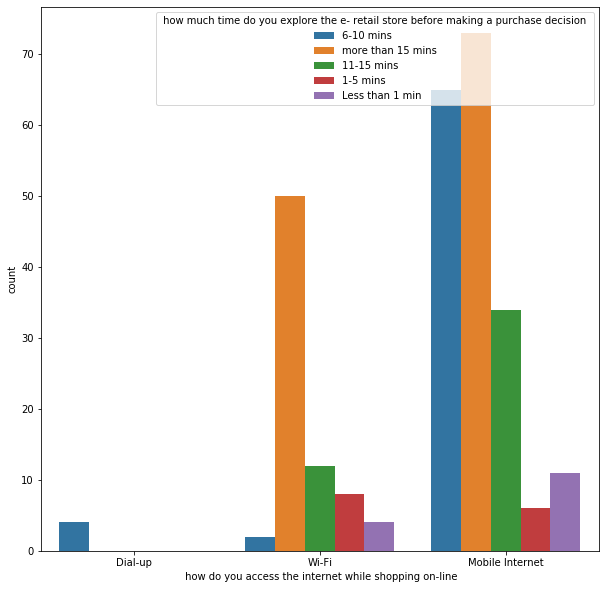

In [22]:
plt.figure(figsize=(10,10))
sns.countplot(x=df[" how do you access the internet while shopping on-line"],hue=df0[" how much time do you explore the e- retail store before making a purchase decision "])

Customers use mobile internet will spend more time on e-retail.

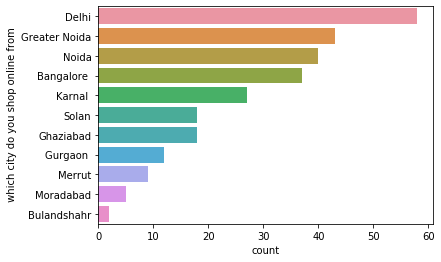

In [23]:
sns.countplot(y=df0[" which city do you shop online from"],order=df0[" which city do you shop online from"].value_counts().index)

Most of the Persons are shop from (Delhi,Greater Noide,Noida,Banglore, karnal)

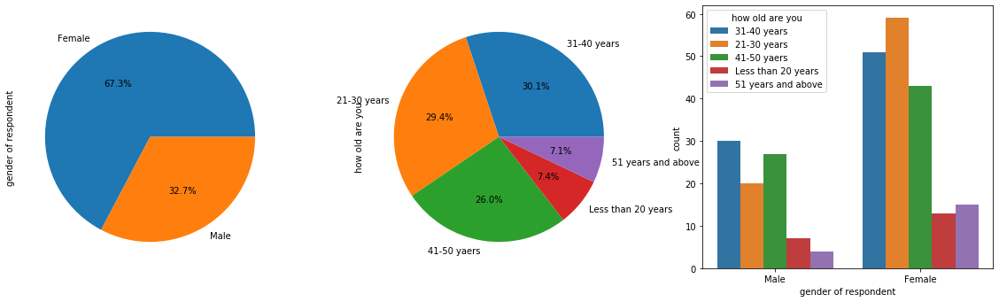

In [24]:
["gender of respondent"," how old are you"]
plt.figure(figsize=(20,12))
plt.subplot(2,3,1)
df0["gender of respondent"].value_counts().plot.pie(autopct="%.1f%%")
plt.subplot(2,3,2)
df0[" how old are you "].value_counts().plot.pie(autopct="%.1f%%")
plt.subplot(2,3,3)
sns.countplot(df0["gender of respondent"],hue=df0[" how old are you "])

most of the customers are females nearly about 67% , Majority of Females are between 31-40, 21-30 and 41-50 

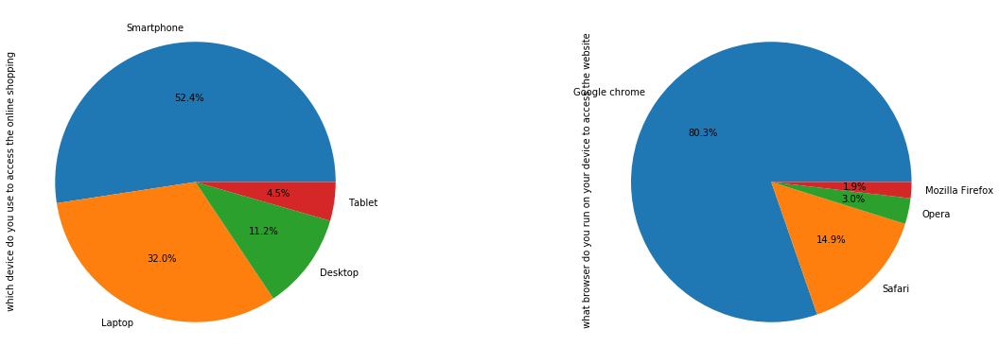

In [25]:
plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
df0[" which device do you use to access the online shopping"].value_counts().plot.pie(autopct="%.1f%%")
plt.subplot(2,2,2)
df0[" what browser do you run on your device to access the website"].value_counts().plot.pie(autopct="%.1f%%")

Lot of users are access shopping on smartphone and Laptop,
Mainly users are useing Google chrome as browser to access website

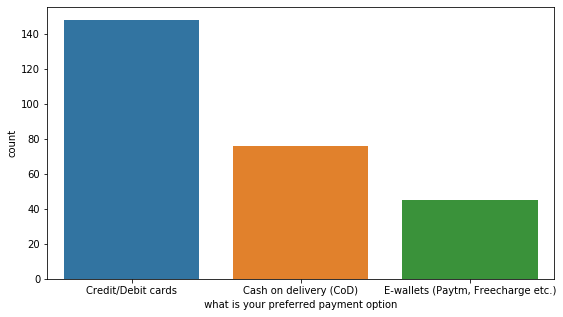

In [26]:
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
sns.countplot(df0[" what is your preferred payment option "],order=df0[" what is your preferred payment option "].value_counts().index)

Card way transaction are high in payment method than other mode of transaction

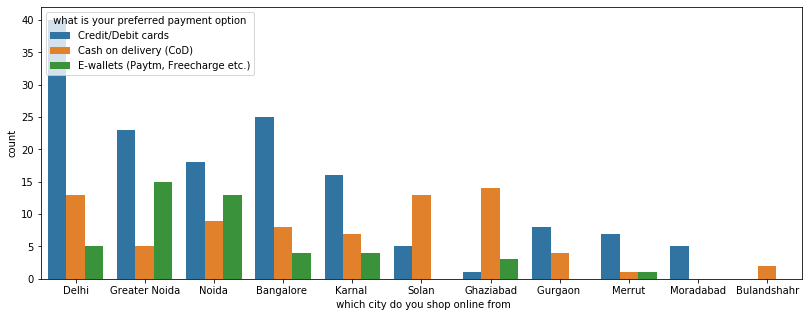

In [27]:
plt.figure(figsize=(30,5))
plt.subplot(1,2,1)
sns.countplot(df0[" which city do you shop online from"],order=df0[" which city do you shop online from"].value_counts().index,hue=df0[" what is your preferred payment option "],hue_order=df0[" what is your preferred payment option "].value_counts().index)

cities like Ghziabad, Solan, cash on delivery payment method plays major roll,
for other cities card payment plays major roll

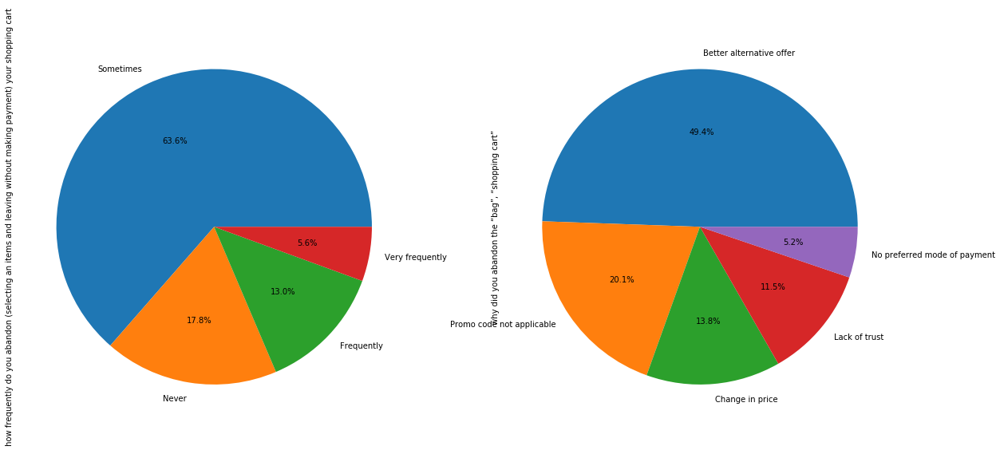

In [28]:
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
df0[" how frequently do you abandon (selecting an items and leaving without making payment) your shopping cart "].value_counts().plot.pie(autopct="%.1f%%")
plt.subplot(2,2,2)
df0[" why did you abandon the “bag”, “shopping cart” "].value_counts().plot.pie(autopct="%.1f%%")

It shows mostly peoples are abandon cart or bag for better alternative offer , 63% of peoples are abandon shopping cart for sometimes

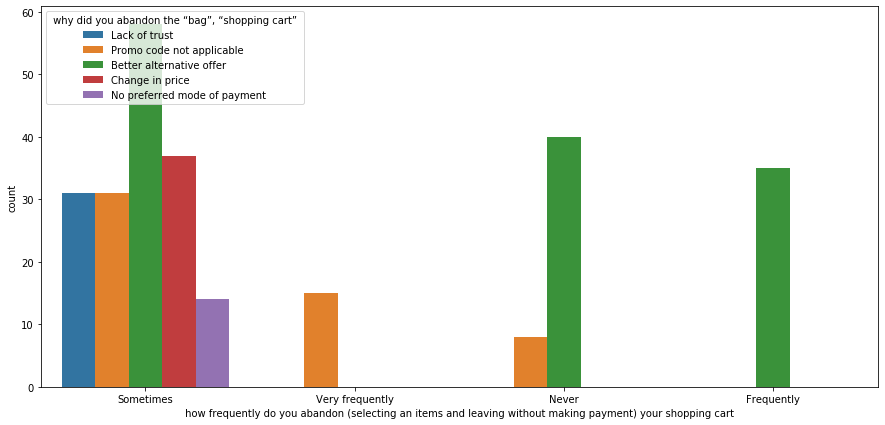

In [29]:
plt.figure(figsize=(15,7))
sns.countplot(df0[" how frequently do you abandon (selecting an items and leaving without making payment) your shopping cart "],hue=df0[" why did you abandon the “bag”, “shopping cart” "])

In [30]:
#ranking dataframe are seperated by its use 
website=["website","speed","Respons","shopping online"]
money=["Payment","money","discounts","saving"]
sat=["customer","user"]
ret=["e-tailer","retail"]

In [31]:
dfw=pd.concat([df1.filter(like="website"),df1.filter(like="speed"),df1.filter(like="respons")],axis=1)
dfm=pd.concat([df1.filter(like="payment"),df1.filter(like="money"),df1.filter(like="discounts"),df1.filter(like="saving")],axis=1)
dfc=pd.concat([df1.filter(like="customer"),df1.filter(like="user")],axis=1)
dfp=df1.filter(like="product")
dfr=pd.concat([df1.filter(like="e-tailer"),df1.filter(like="retail")],axis=1)
dfs=df1.filter(like="shopping online")

In [32]:
print(dfs.shape,dfm.shape,dfw.shape,dfp.shape,dfr.shape,dfc.shape)

(269, 4) (269, 4) (269, 9) (269, 5) (269, 5) (269, 7)


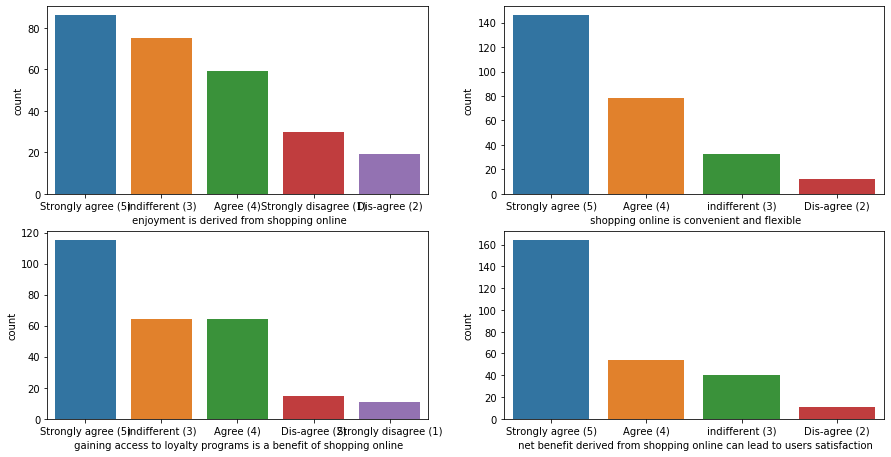

In [33]:
#shopping satisfaction
plt.figure(figsize=(15,20))
for i in dfs.columns:
    plt.subplot(5,2,(dfs.columns.get_loc(i)+1))
    sns.countplot(df1[i],order=df[i].value_counts().index)

mostly peoples are strongly agree with shopping benefit,satisfaction,flexible,enjoyment of shopping

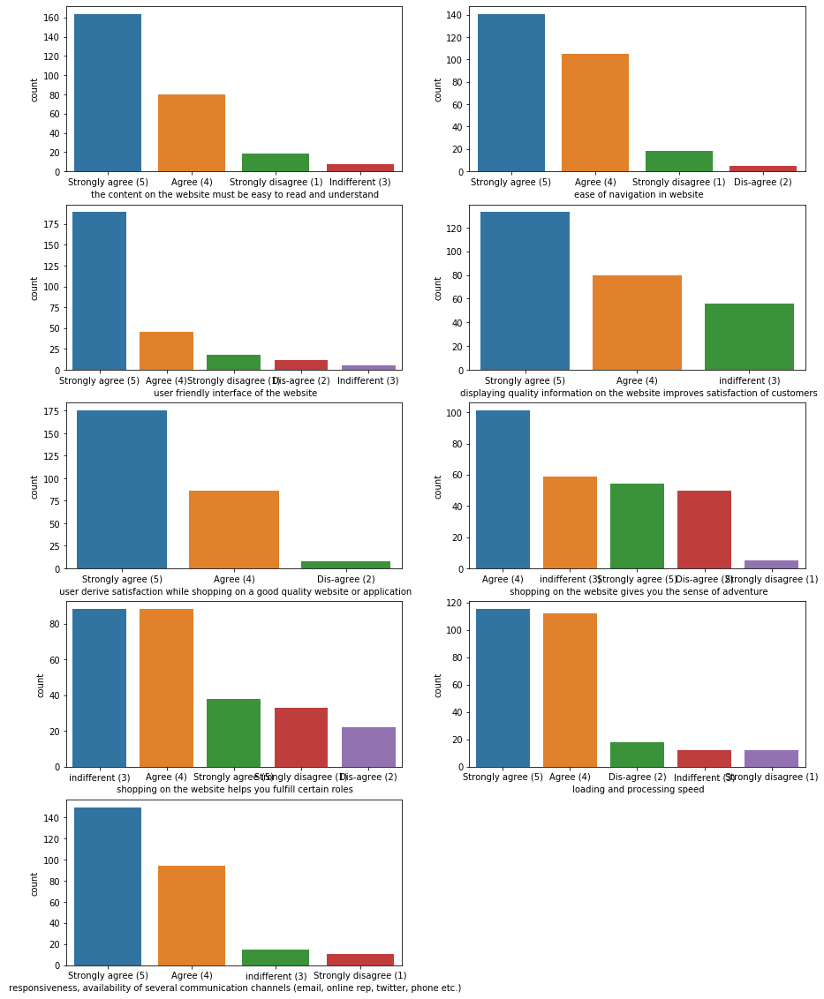

In [34]:
#website ratings
plt.figure(figsize=(15,20))
for i in dfw.columns:
    plt.subplot(5,2,(dfw.columns.get_loc(i)+1))
    sns.countplot(df1[i],order=df[i].value_counts().index)

most customers are strongly agree with website speed, response, and website use 

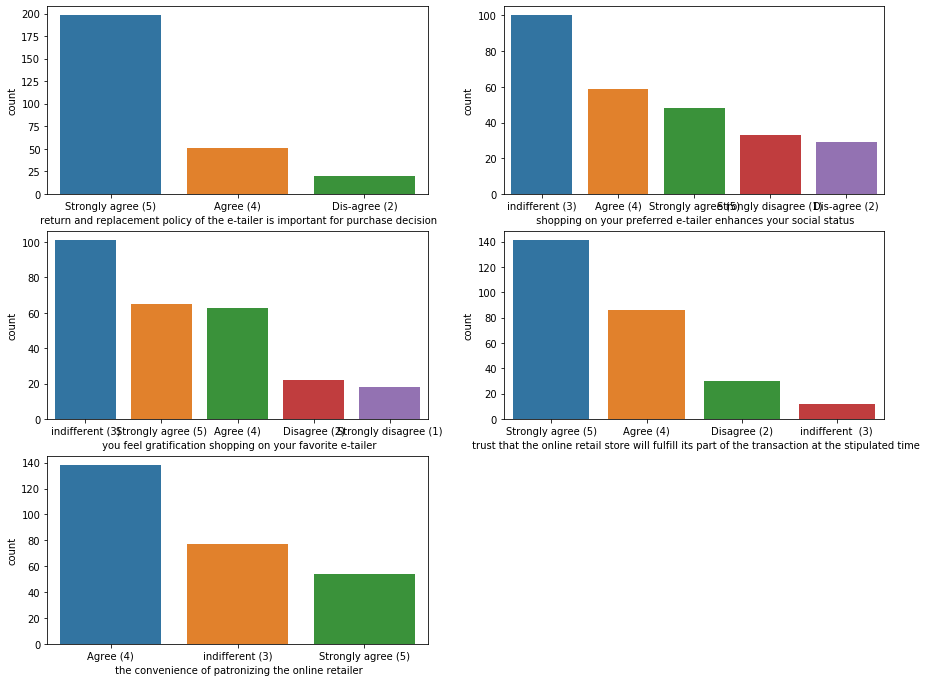

In [35]:
#retailer ratings 
plt.figure(figsize=(15,20))
for i in dfr.columns:
    plt.subplot(5,2,(dfr.columns.get_loc(i)+1))
    sns.countplot(df1[i],order=df[i].value_counts().index)

most customers are agree with trust on retailer and replacement policy,
most customers are rate indifferent for retailer enhances of social status and gratification shopping

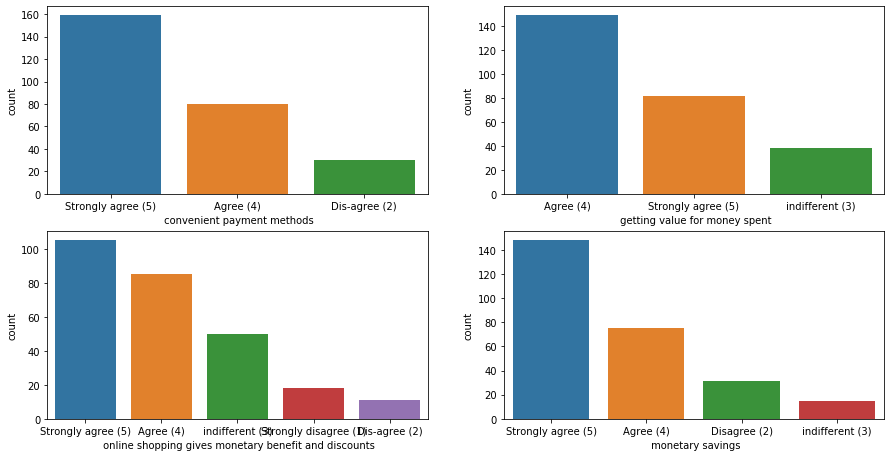

In [36]:
#money satisfaction 
plt.figure(figsize=(15,20))
for i in dfm.columns:
    plt.subplot(5,2,(dfm.columns.get_loc(i)+1))
    sns.countplot(df1[i],order=df[i].value_counts().index)

Most customers are strongly agree with money satisfaction and trust

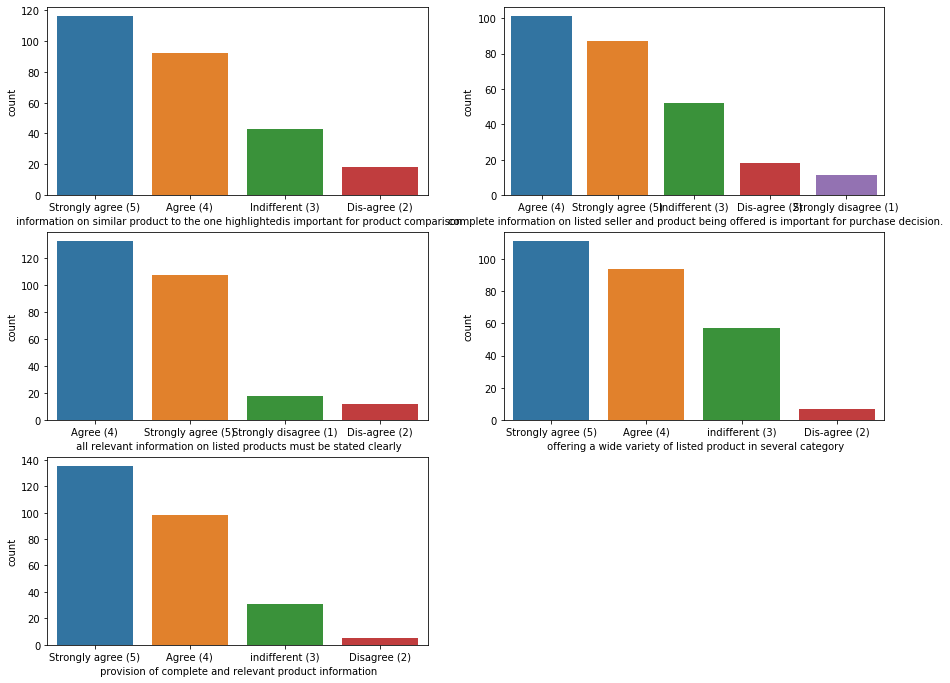

In [37]:
#product ratings
plt.figure(figsize=(15,20))
for i in dfp.columns:
    plt.subplot(5,2,(dfp.columns.get_loc(i)+1))
    sns.countplot(df1[i],order=df[i].value_counts().index)

most customers are rated strongly agree with product related features 

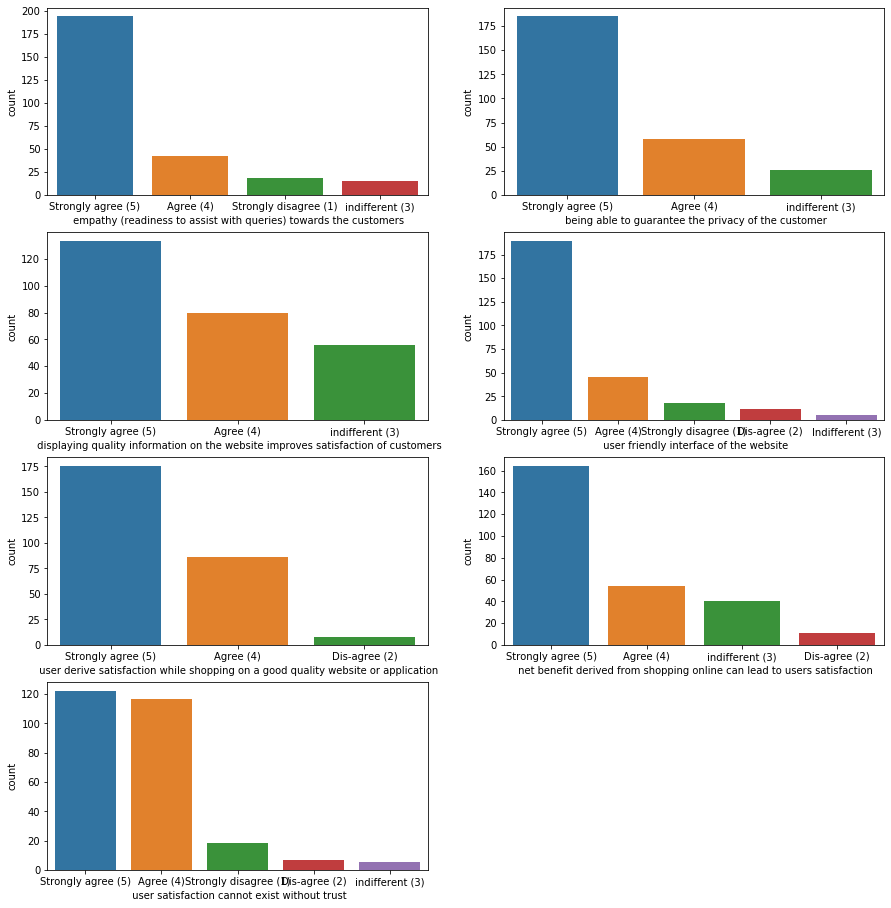

In [38]:
#customers satisfaction ratings
plt.figure(figsize=(15,20))
for i in dfc.columns:
    plt.subplot(5,2,(dfc.columns.get_loc(i)+1))
    sns.countplot(df1[i],order=df[i].value_counts().index)

Most customers are strongly agree with their satisfaction and trust

In [39]:
df2.columns

Index(['from the following, tick any (or all) of the online retailers you have shopped from; ',
       'easy to use website or application',
       'visual appealing web-page layout', 'wild variety of product on offer',
       'complete, relevant description information of products',
       'fast loading website speed of website and application',
       'reliability of the website or application',
       'quickness to complete purchase',
       'availability of several payment options', 'speedy order delivery ',
       'privacy of customers’ information',
       'security of customer financial information',
       'perceived trustworthiness',
       'presence of online assistance through multi-channel',
       'longer time to get logged in (promotion, sales period)',
       'longer time in displaying graphics and photos (promotion, sales period)',
       'late declaration of price (promotion, sales period)',
       'longer page loading time (promotion, sales period)',
       'limited m

In [40]:
df2.nunique()                   #to check no of unique values in each columns

from the following, tick any (or all) of the online retailers you have shopped from;      9
easy to use website or application                                                       10
visual appealing web-page layout                                                         10
wild variety of product on offer                                                          9
complete, relevant description information of products                                   11
fast loading website speed of website and application                                    10
reliability of the website or application                                                10
quickness to complete purchase                                                            9
availability of several payment options                                                  11
speedy order delivery                                                                     6
privacy of customers’ information                                               

In [41]:
for i in df2.columns:                           #to check unique values in each columns
    print(i,df2[i].unique()) 

from the following, tick any (or all) of the online retailers you have shopped from;  ['Amazon.in, Paytm.com'
 'Amazon.in, Flipkart.com, Myntra.com, Snapdeal.com'
 'Amazon.in, Paytm.com, Myntra.com'
 'Amazon.in, Flipkart.com, Paytm.com, Myntra.com, Snapdeal.com'
 'Amazon.in, Flipkart.com, Paytm.com, Snapdeal.com'
 'Amazon.in, Flipkart.com' 'Amazon.in, Flipkart.com, Snapdeal.com'
 'Amazon.in' 'Amazon.in, Flipkart.com, Paytm.com']
easy to use website or application ['Paytm.com' 'Amazon.in, Flipkart.com, Myntra.com, Snapdeal.com'
 'Amazon.in, Paytm.com, Myntra.com'
 'Amazon.in, Flipkart.com, Paytm.com, Myntra.com, Snapdeal.com'
 'Amazon.in, Flipkart.com, Paytm.com, Snapdeal.com'
 'Amazon.in, Flipkart.com' 'Amazon.in, Flipkart.com, Myntra.com'
 'Amazon.in' 'Amazon.in, Paytm.com' 'Flipkart.com']
visual appealing web-page layout ['Flipkart.com' 'Amazon.in, Myntra.com' 'Amazon.in, Paytm.com, Myntra.com'
 'Amazon.in, Flipkart.com, Paytm.com, Myntra.com, Snapdeal.com'
 'Myntra.com' 'Amazon.in, 

In [42]:
df2

,"from the following, tick any (or all) of the online retailers you have shopped from;",easy to use website or application,visual appealing web-page layout,wild variety of product on offer,"complete, relevant description information of products",fast loading website speed of website and application,reliability of the website or application,quickness to complete purchase,availability of several payment options,speedy order delivery,privacy of customers’ information,security of customer financial information,perceived trustworthiness,presence of online assistance through multi-channel,"longer time to get logged in (promotion, sales period)","longer time in displaying graphics and photos (promotion, sales period)","late declaration of price (promotion, sales period)","longer page loading time (promotion, sales period)","limited mode of payment on most products (promotion, sales period)",longer delivery period,change in website/application design,frequent disruption when moving from one page to another,website is as efficient as before,which of the indian online retailer would you recommend to a friend
0,"Amazon.in, Paytm.com",Paytm.com,Flipkart.com,Flipkart.com,Snapdeal.com,Snapdeal.com,Paytm.com,Paytm.com,Patym.com,Amazon.in,Amazon.in,Amazon.in,Flipkart.com,Paytm.com,Amazon.in,Amazon.in,Flipkart.com,Flipkart.com,Amazon.in,Paytm.com,Flipkart.com,Amazon.in,Amazon.in,Flipkart.com
1,"Amazon.in, Flipkart.com, Myntra.com, Snapdeal.com","Amazon.in, Flipkart.com, Myntra.com, Snapdeal.com","Amazon.in, Myntra.com","Flipkart.com, Myntra.com","Amazon.in, Flipkart.com, Myntra.com","Amazon.in, Flipkart.com, Myntra.com",Myntra.com,"Amazon.com, Flipkart.com, Myntra.com","Amazon.in, Flipkart.com, Myntra.com","Amazon.in, Flipkart.com",Myntra.com,Myntra.com,Myntra.com,"Amazon.in, Flipkart.com, Myntra.com","Amazon.in, Flipkart.com",Myntra.com,snapdeal.com,Snapdeal.com,Snapdeal.com,Snapdeal.com,Amazon.in,Myntra.com,"Amazon.in, Flipkart.com","Amazon.in, Myntra.com"
2,"Amazon.in, Paytm.com, Myntra.com","Amazon.in, Paytm.com, Myntra.com","Amazon.in, Paytm.com, Myntra.com","Amazon.in, Myntra.com","Amazon.in, Paytm.com, Myntra.com","Amazon.in, Paytm.com","Amazon.in, Paytm.com, Myntra.com","Amazon.com, Paytm.com, Myntra.com","Patym.com, Myntra.com",Amazon.in,Amazon.in,"Amazon.in, Paytm.com, Myntra.com","Amazon.in, Myntra.com",Myntra.com,Myntra.com,Myntra.com,Myntra.com,Myntra.com,Amazon.in,Paytm.com,Paytm.com,Paytm.com,Amazon.in,"Amazon.in, Paytm.com, Myntra.com"
3,"Amazon.in, Flipkart.com, Paytm.com, Myntra.com...","Amazon.in, Flipkart.com, Paytm.com, Myntra.com...","Amazon.in, Flipkart.com, Paytm.com, Myntra.com...","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Snapdeal.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.com, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com, Myntra.com","Amazon.in, Flipkart.com, Snapdeal.com","Amazon.in, Flipkart.com, Myntra.com","Amazon.in, Flipkart.com, Snapdeal.com","Amazon.in, Flipkart.com, Snapdeal.com","Amazon.in, Flipkart.com, Myntra.com, Snapdeal",Snapdeal.com,"Myntra.com, Snapdeal.com",Myntra.com,Paytm.com,Paytm.com,Paytm.com,"Amazon.in, Flipkart.com","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com"
4,"Amazon.in, Flipkart.com, Paytm.com, Myntra.com...","Amazon.in, Flipkart.com, Paytm.com, Myntra.com...",Myntra.com,Myntra.com,"Amazon.in, Flipkart.com, Paytm.com, Myntra.com...",Amazon.in,"Amazon.in, Paytm.com, Myntra.com","Amazon.com, Flipkart.com, Paytm.com, Myntra.co...","Amazon.in, Flipkart.com, Patym.com, Myntra.com...",Amazon.in,"Amazon.in, Paytm.com",Paytm.com,"Amazon.in, Myntra.com","Amazon.in, Myntra.com","Flipkart.com, Paytm.com",Paytm.com,Paytm.com,Paytm.com,Snapdeal.com,Paytm.com,Amazon.in,Snapdeal.com,Paytm.com,"Amazon.in, Myntra.com"
5,"Amazon.in, Flipkart.com, Paytm.com, Myntra.com...","Amazon.in, Flipkart.com, Paytm.com, Myntra.com...","Amazon.in, Flipkart.com","Amazon.in, Flipkart.com, Paytm.com","Amazon.in, Flipkart.com, Paytm

there are some positive ratings and negative ratings columns, so we have to separate it for better visualization

In [44]:
df2.columns.get_loc("longer time to get logged in (promotion, sales period)")

14

In [45]:
df2.columns.get_loc("frequent disruption when moving from one page to another")

21

In [46]:
dn=df2.iloc[:,14:22]              #filter negative rating columns
dn.shape

(269, 8)

In [47]:
dp=df2.drop(dn.columns,axis=1)    #filter positive rating columns
dp.shape

(269, 16)

In [48]:
list1=[]                          
list2=[]
for i in dp.columns:                    #develop dummies for every website ratings columns by each sites
    list1.append(df2[i].str.get_dummies(sep=", ").add_prefix(" ").add_prefix(i))   
for i in dn.columns:
    list2.append(df2[i].str.get_dummies(sep=", ").add_prefix(" ").add_prefix(i))

In [49]:
good=pd.concat(list1,axis=1)
bad=pd.concat(list2,axis=1)

In [50]:
good

,"from the following, tick any (or all) of the online retailers you have shopped from; Amazon.in","from the following, tick any (or all) of the online retailers you have shopped from; Flipkart.com","from the following, tick any (or all) of the online retailers you have shopped from; Myntra.com","from the following, tick any (or all) of the online retailers you have shopped from; Paytm.com","from the following, tick any (or all) of the online retailers you have shopped from; Snapdeal.com",easy to use website or application Amazon.in,easy to use website or application Flipkart.com,easy to use website or application Myntra.com,easy to use website or application Paytm.com,easy to use website or application Snapdeal.com,visual appealing web-page layout Amazon.in,visual appealing web-page layout Flipkart.com,visual appealing web-page layout Myntra.com,visual appealing web-page layout Paytm.com,visual appealing web-page layout Snapdeal.com,wild variety of product on offer Amazon.in,wild variety of product on offer Flipkart.com,wild variety of product on offer Myntra.com,wild variety of product on offer Paytm.com,wild variety of product on offer Snapdeal.com,"complete, relevant description information of products Amazon.in","complete, relevant description information of products Flipkart.com","complete, relevant description information of products Myntra.com","complete, relevant description information of products Paytm.com","complete, relevant description information of products Snapdeal.com",fast loading website speed of website and application Amazon.in,fast loading website speed of website and application Flipkart.com,fast loading website speed of website and application Myntra.com,fast loading website speed of website and application Paytm.com,fast loading website speed of website and application Snapdeal.com,reliability of the website or application Amazon.in,reliability of the website or application Flipkart.com,reliability of the website or application Myntra.com,reliability of the website or application Paytm.com,reliability of the website or application Snapdeal.com,quickness to complete purchase Amazon.com,quickness to complete purchase Flipkart.com,quickness to complete purchase Myntra.com,quickness to complete purchase Paytm.com,quickness to complete purchase Snapdeal,availability of several payment options Amazon.in,availability of several payment options Flipkart.com,availability of several payment options Myntra.com,availability of several payment options Patym.com,availability of several payment options Snapdeal.com,speedy order delivery Amazon.in,speedy order delivery Flipkart.com,speedy order delivery Myntra.com,speedy order delivery Snapdeal.com,privacy of customers’ information Amazon.in,privacy of customers’ information Flipkart.com,privacy of customers’ information Myntra.com,privacy of customers’ information Paytm.com,privacy of customers’ information Snapdeal.com,security of customer financial information Amazon.in,security of customer financial information Flipkart.com,security of customer financial information Myntra.com,security of customer financial information Paytm.com,security of customer financial information Snapdeal.com,perceived trustworthiness Amazon.in,perceived trustworthiness Flipkart.com,perceived trustworthiness Myntra.com,perceived trustworthiness Paytm.com,perceived trustworthiness Snapdeal.com,presence of online assistance through multi-channel Amazon.in,presence of online assistance through multi-channel Flipkart.com,presence of online assistance through multi-channel Myntra.com,presence of online assistance through multi-channel Paytm.com,presence of online assistance through multi-channel Snapdeal,website is as efficient as before Amazon.in,website is as efficient as before Flipkart.com,website is as efficient as before Myntra.com,website is as efficient as before Paytm.com,website is as efficient as before Snapdeal.com,which of the indian online retailer would you recommend to a friend 

In [51]:
bad

,"longer time to get logged in (promotion, sales period) Amazon.in","longer time to get logged in (promotion, sales period) Flipkart.com","longer time to get logged in (promotion, sales period) Myntra.com","longer time to get logged in (promotion, sales period) Paytm.com","longer time to get logged in (promotion, sales period) Snapdeal.com","longer time in displaying graphics and photos (promotion, sales period) Amazon.in","longer time in displaying graphics and photos (promotion, sales period) Flipkart.com","longer time in displaying graphics and photos (promotion, sales period) Myntra.com","longer time in displaying graphics and photos (promotion, sales period) Paytm.com","longer time in displaying graphics and photos (promotion, sales period) Snapdeal.com","late declaration of price (promotion, sales period) Amazon.in","late declaration of price (promotion, sales period) Flipkart.com","late declaration of price (promotion, sales period) Myntra.com","late declaration of price (promotion, sales period) Paytm.com","late declaration of price (promotion, sales period) snapdeal.com","longer page loading time (promotion, sales period) Amazon.in","longer page loading time (promotion, sales period) Flipkart.com","longer page loading time (promotion, sales period) Myntra.com","longer page loading time (promotion, sales period) Paytm.com","longer page loading time (promotion, sales period) Snapdeal.com","limited mode of payment on most products (promotion, sales period) Amazon.in","limited mode of payment on most products (promotion, sales period) Flipkart.com","limited mode of payment on most products (promotion, sales period) Myntra.com","limited mode of payment on most products (promotion, sales period) Paytm.com","limited mode of payment on most products (promotion, sales period) Snapdeal.com",longer delivery period Amazon.in,longer delivery period Flipkart.com,longer delivery period Myntra.com,longer delivery period Paytm.com,longer delivery period Snapdeal.com,change in website/application design Amazon.in,change in website/application design Flipkart.com,change in website/application design Myntra.com,change in website/application design Paytm.com,change in website/application design Snapdeal.com,frequent disruption when moving from one page to another Amazon.in,frequent disruption when moving from one page to another Flipkart.com,frequent disruption when moving from one page to another Myntra.com,frequent disruption when moving from one page to another Paytm.com,frequent disruption when moving from one page to another Snapdeal.com
0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0
1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0
2,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0
3,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,1,1,0,0,0
4,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1
5,0,1,0,1,1,1,0,0,1,0,1,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0
6,1,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0
7,1,1,0,0,0,1,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0
8,1,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1
9,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0


In [76]:
Total_positive_ratings=[]
Total_negative_ratings=[]
for l in ["Amazon","Flipkart","Myntra","Paytm","Snapdeal"]:   
    Total_positive_ratings.append(good.sum().filter(like=l).sum())          #Total positive ratings
    Total_negative_ratings.append(bad.sum().filter(like=l).sum())           #Total negative ratings
print(Total_positive_ratings)
print(Total_negative_ratings)

[3633, 2628, 1372, 1030, 1072]
[745, 539, 388, 524, 503]


In [82]:
web_div=pd.DataFrame([Total_positive_ratings,Total_negative_ratings],columns=["Amazon","Flipkart","Myntra","Paytm","Snapdeal"],index=["positive","negative"])

In [84]:
web_div

,Amazon,Flipkart,Myntra,Paytm,Snapdeal
positive,3633,2628,1372,1030,1072
negative,745,539,388,524,503


Amazon and flipkart are liked by most of the persons than different websites

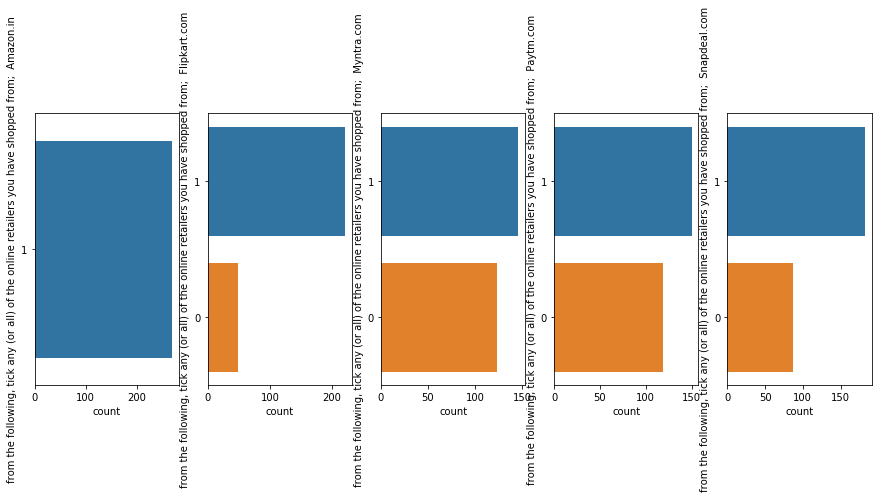

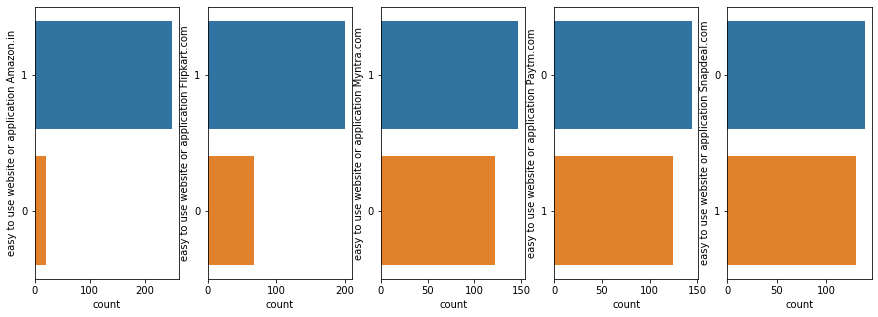

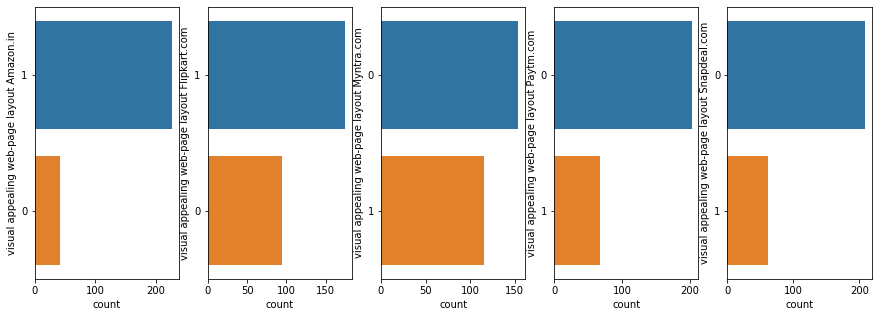

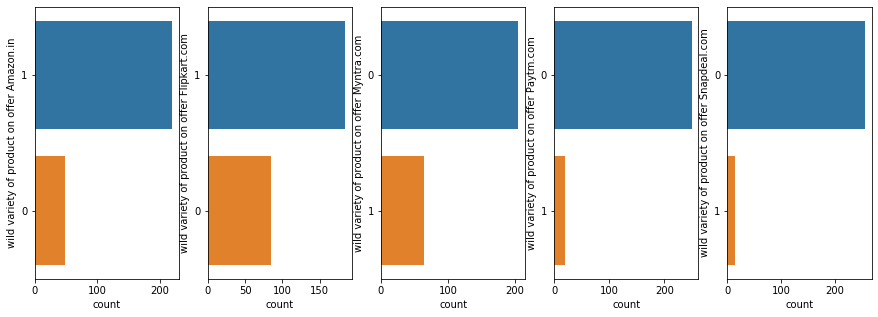

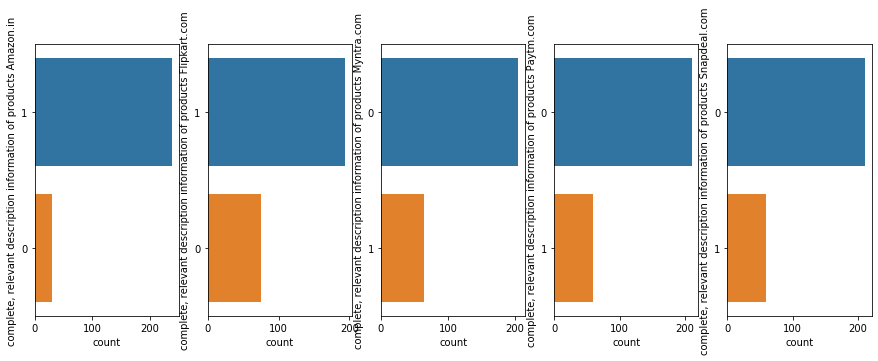

...

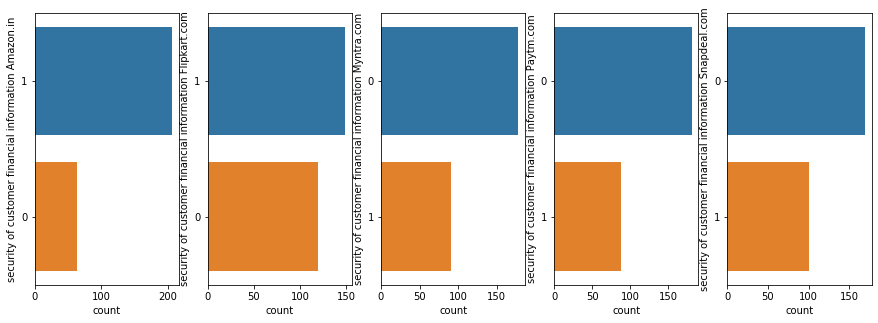

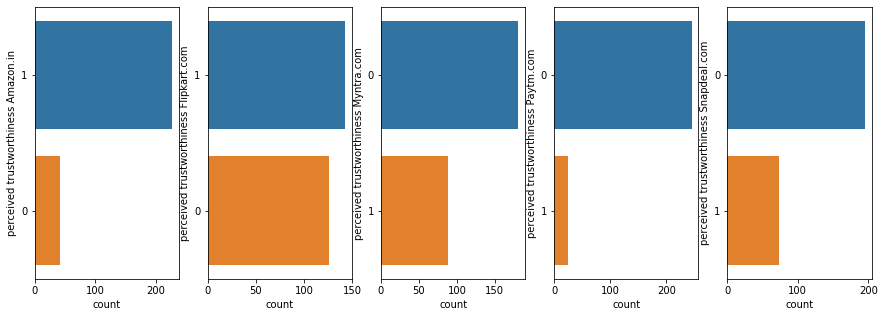

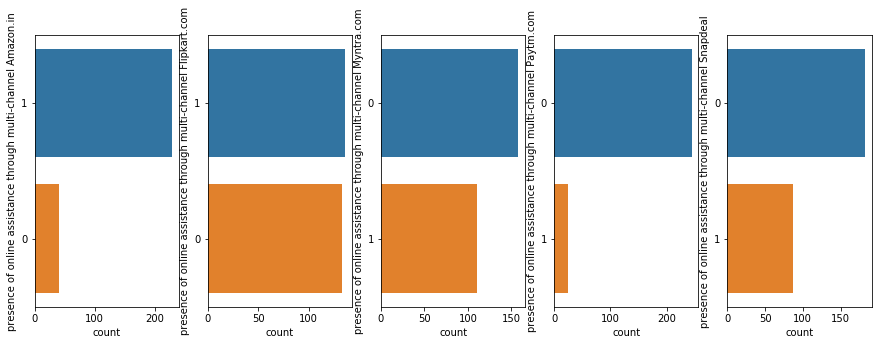

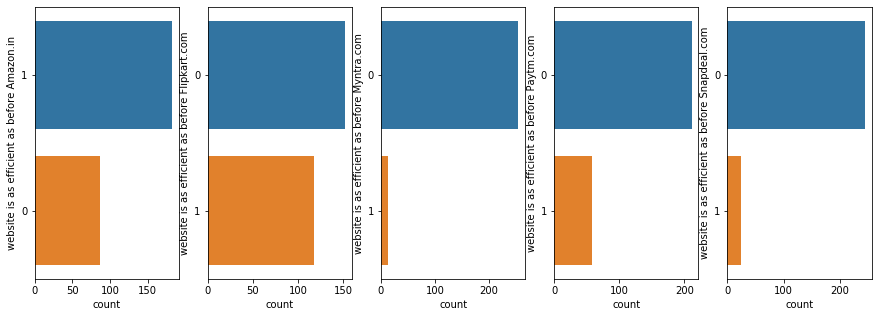

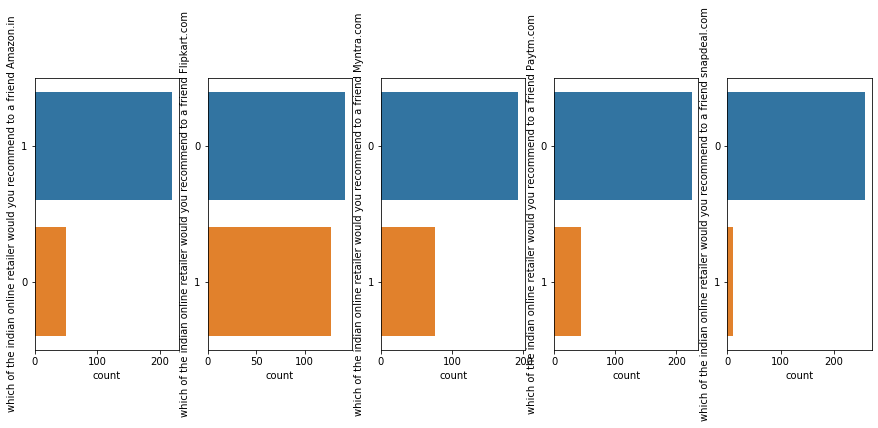

In [58]:
for o in dp.columns:
    cc=good.filter(like=o)
    plt.figure(figsize=(15,5))
    for i in cc.columns:
        plt.subplot(1,5,cc.columns.get_loc(i)+1)
        sns.countplot(y=cc[i],order=cc[i].value_counts().index)
    plt.show()

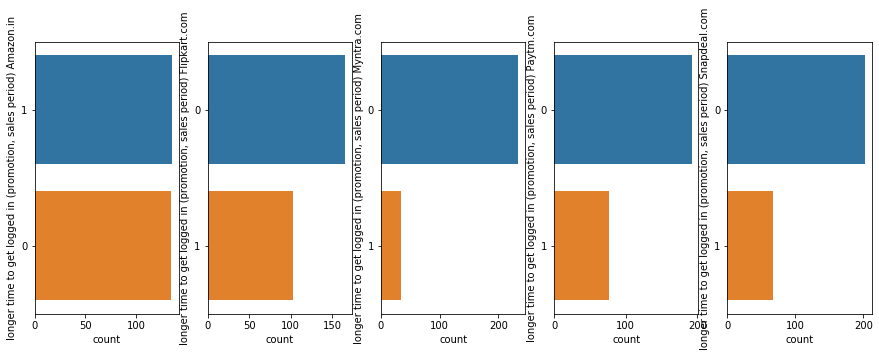

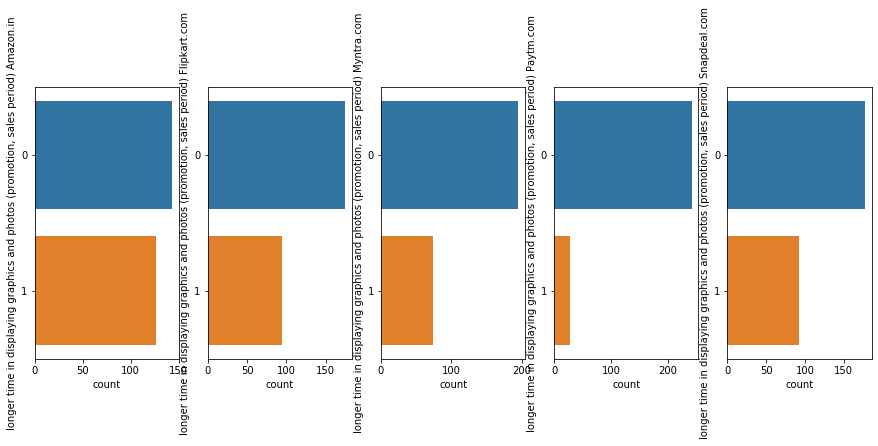

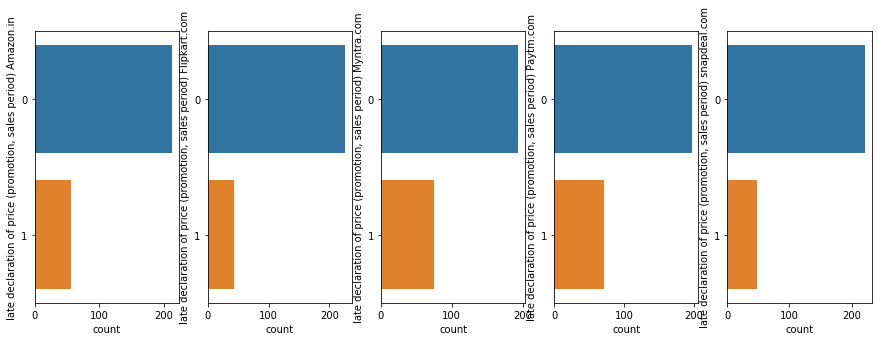

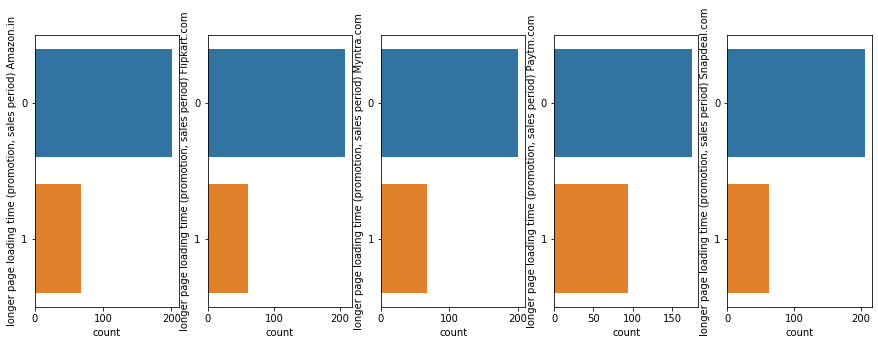

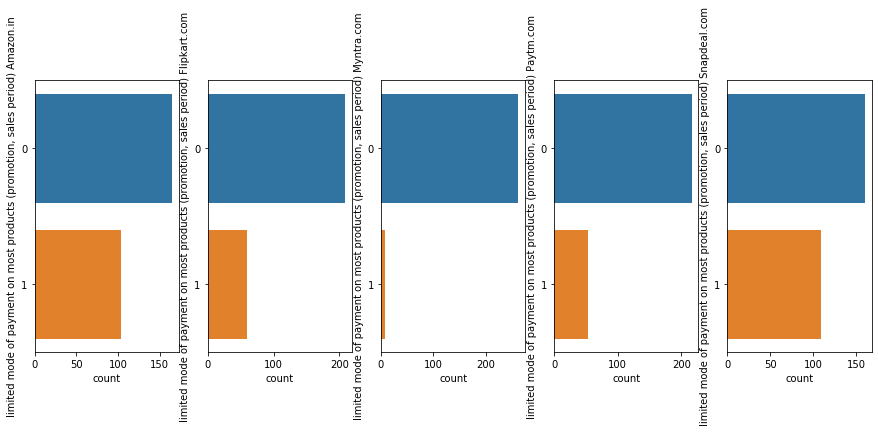

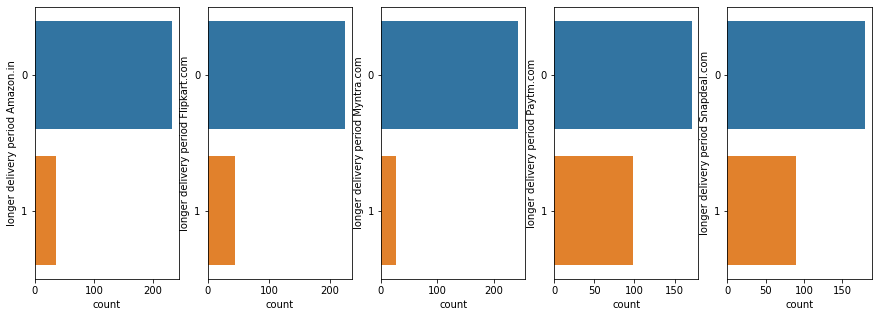

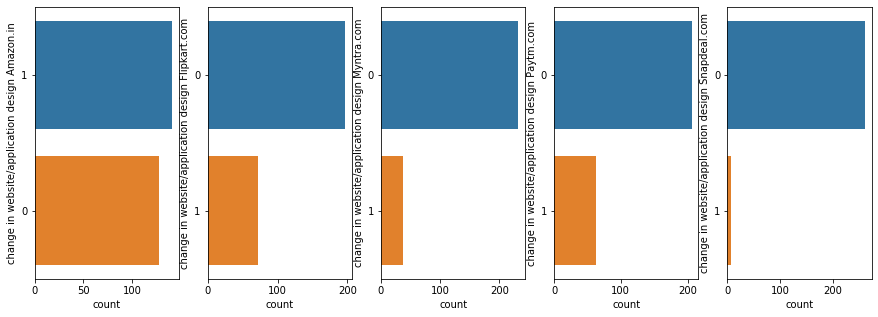

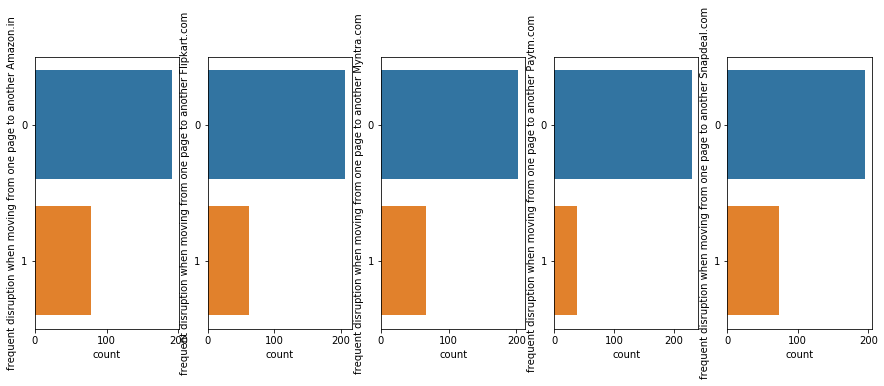

In [59]:
for o in dn.columns:
    cc=bad.filter(like=o)
    plt.figure(figsize=(15,5))
    for i in cc.columns:
        plt.subplot(1,5,cc.columns.get_loc(i)+1)
        sns.countplot(y=cc[i],order=cc[i].value_counts().index)
    plt.show()

In [61]:
train_df=pd.concat([df0,df1,good,bad],axis=1)

In [62]:
train_df

,gender of respondent,how old are you,which city do you shop online from,what is the pin code of where you shop online from,since how long you are shopping online,how many times you have made an online purchase in the pastyear,how do you access the internet while shopping on-line,which device do you use to access the online shopping,what is the screen size of your mobile device,what is the operating system (os) of your device,what browser do you run on your device to access the website,which channel did you follow to arrive at your favorite online store for the first time,"after first visit, how do you reach the online retail store",how much time do you explore the e- retail store before making a purchase decision,what is your preferred payment option,how frequently do you abandon (selecting an items and leaving without making payment) your shopping cart,"why did you abandon the “bag”, “shopping cart”",the content on the website must be easy to read and understand,information on similar product to the one highlightedis important for product comparison,complete information on listed seller and product being offered is important for purchase decision.,all relevant information on listed products must be stated clearly,ease of navigation in website,loading and processing speed,user friendly interface of the website,convenient payment methods,trust that the online retail store will fulfill its part of the transaction at the stipulated time,empathy (readiness to assist with queries) towards the customers,being able to guarantee the privacy of the customer,"responsiveness, availability of several communication channels (email, online rep, twitter, phone etc.)",online shopping gives monetary benefit and discounts,enjoyment is derived from shopping online,shopping online is convenient and flexible,return and replacement policy of the e-tailer is important for purchase decision,gaining access to loyalty programs is a benefit of shopping online,displaying quality information on the website improves satisfaction of customers,user derive satisfaction while shopping on a good quality website or application,net benefit derived from shopping online can lead to users satisfaction,user satisfaction cannot exist without trust,offering a wide variety of listed product in several category,provision of complete and relevant product information,...,"longer time to get logged in (promotion, sales period) Amazon.in","longer time to get logged in (promotion, sales period) Flipkart.com","longer time to get logged in (promotion, sales period) Myntra.com","longer time to get logged in (promotion, sales period) Paytm.com","longer time to get logged in (promotion, sales period) Snapdeal.com","longer time in displaying graphics and photos (promotion, sales period) Amazon.in","longer time in displaying graphics and photos (promotion, sales period) Flipkart.com","longer time in displaying graphics and photos (promotion, sales period) Myntra.com","longer time in displaying graphics and photos (promotion, sales period) Paytm.com","longer time in displaying graphics and photos (promotion, sales period) Snapdeal.com","late declaration of price (promotion, sales period) Amazon.in","late declaration of price (promotion, sales period) Flipkart.com","late declaration of price (promotion, sales period) Myntra.com","late declaration of price (promotion, sales period) Paytm.com","late declaration of price (promotion, sales period) snapdeal.com","longer page loading time (promotion, sales period) Amazon.in","longer page loading time (promotion, sales period) Flipkart.com","longer page loading time (promotion, sales period) Myntra.com","longer page loading time (promotion, sales period) Paytm.com","longer page loading time (promotion, sales period) Snapdeal.com","limited mode of payment on most products (promotion, sales period) Amazon.in","limited mode of payment on most products (promotion, sales period) Flipkart.com","limited mode of payment on most products (promotion,

In [63]:
train_df.shape

(269, 166)